___
<img style="float: right; margin: 0px 0px 15px 15px;" src="https://keepcoding.io/wp-content/uploads/2022/08/image-136-1024x444.png" width="500px" height="100px" />


# <font color= #8A0829> Perceptrón multicapa (MLP).</font>

<Strong> Objetivos </Strong>
- Programar la primera red neuronal (Multi Layer Perceptron (MLP)).
- Comprender la abstracción que se realiza cuando usamos Keras para programar nuestra NN.
- Entender de manera intuitiva el algoritmo de Backpropagation.
> Referencias: 
    > - [Jugando con Redes Neuronales](https://www.youtube.com/watch?v=FVozZVUNOOA&list=PL-Ogd76BhmcB9OjPucsnc2-piEE96jJDQ&index=3)
    > - [¿Qué es una Red Neuronal? Parte 3 : Backpropagation| DotCSV](https://www.youtube.com/watch?v=eNIqz_noix8&list=PL-Ogd76BhmcB9OjPucsnc2-piEE96jJDQ&index=5)
___

Antes de empezar a ver los aspectos teóricos que necesitamos saber para ajustar nuestros pesos de una red neuronal vamos a ver el efecto que tienen en nuestras redes de las capas, neuronas, funciones de activación, etc. de manera gráfica. Para esto vamos a usar el siguiente enlace:

https://playground.tensorflow.org/

## ¿Cómo podemos ajustar los pesos de mi red neuronal para disminuir el funcional de costo?

Recordar como se ve el gradiente de una función

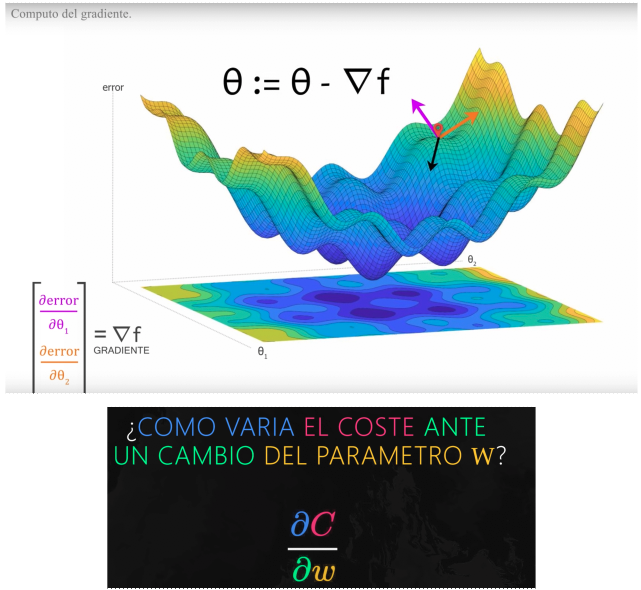

En el caso de NN cuando analizamos como varía el coste con respecto a los parámetros es un poco más amplio. Observe la siguiente NN

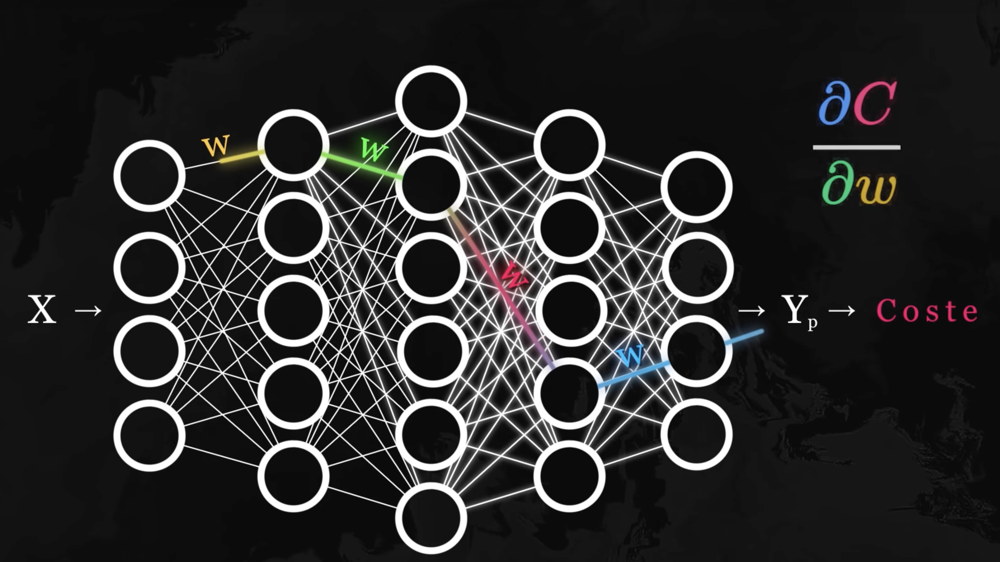

## Algoritmo Backpropagation
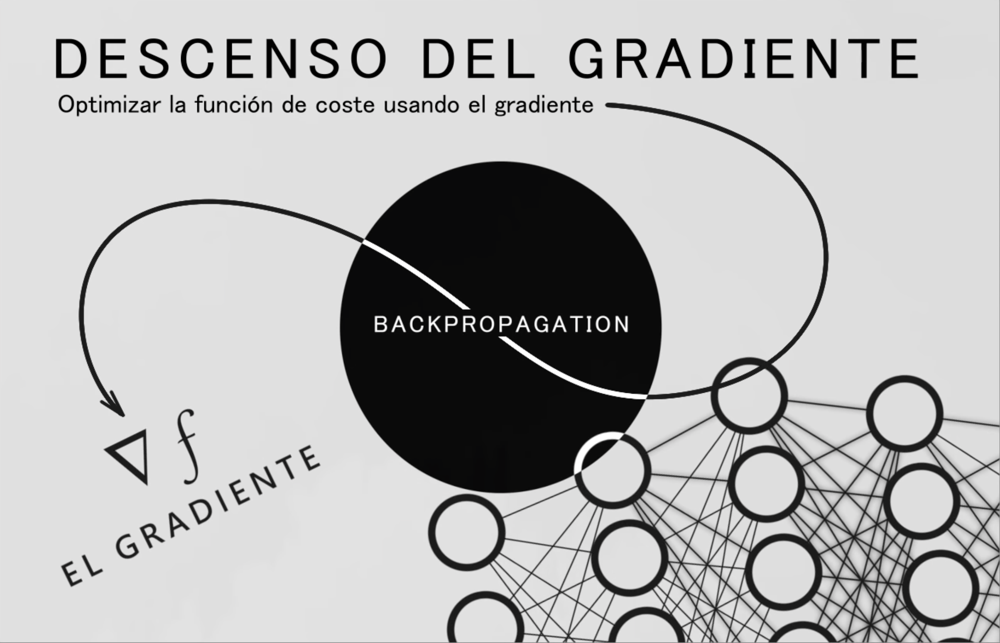

## Procedimiento

Supongamos que tenemos la siguiente NN

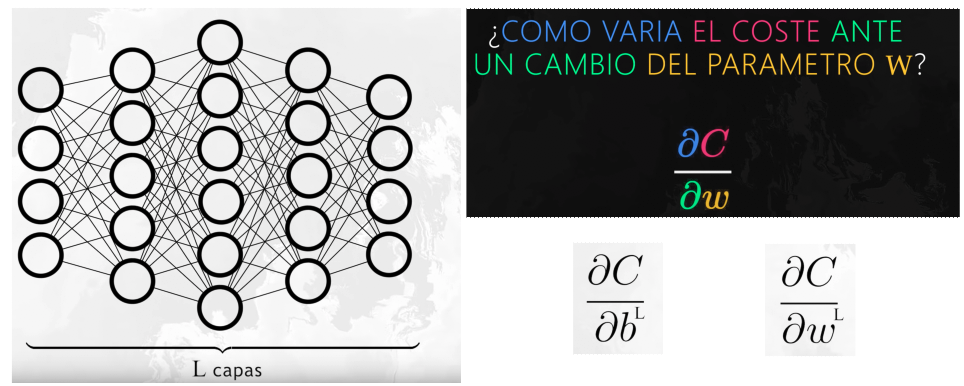
### Empezamos a calcular nuestras derivadas parciales de la última hasta la primera capa

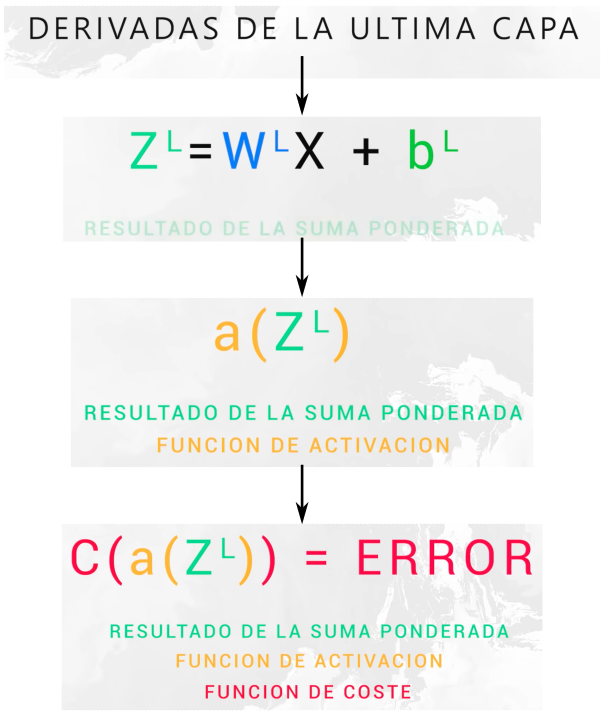

Aplicando la regla de la cadena las derivadas que necesitaríamos calcular serían las siguientes:

### 1. Analicemos la última capa (capa $L$)
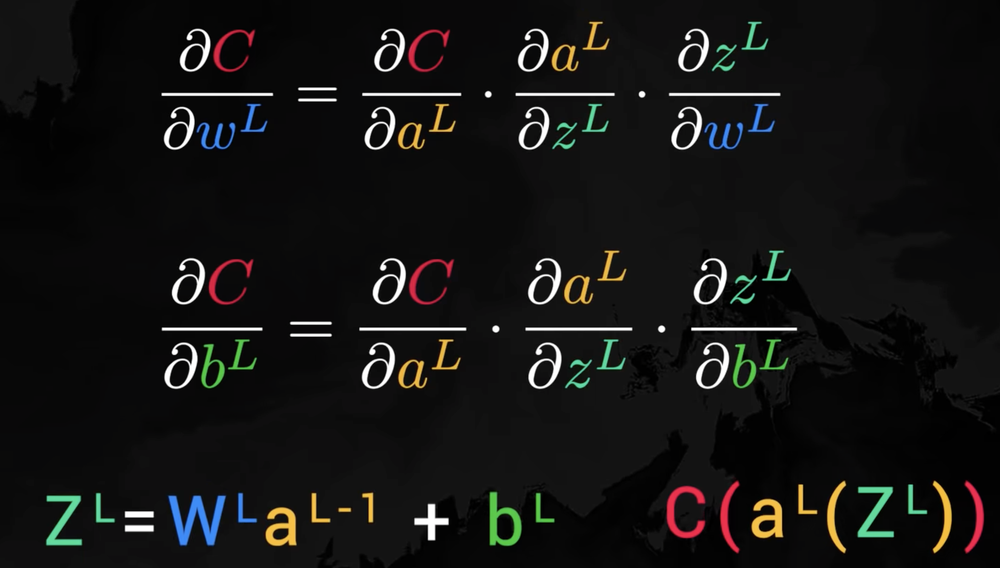

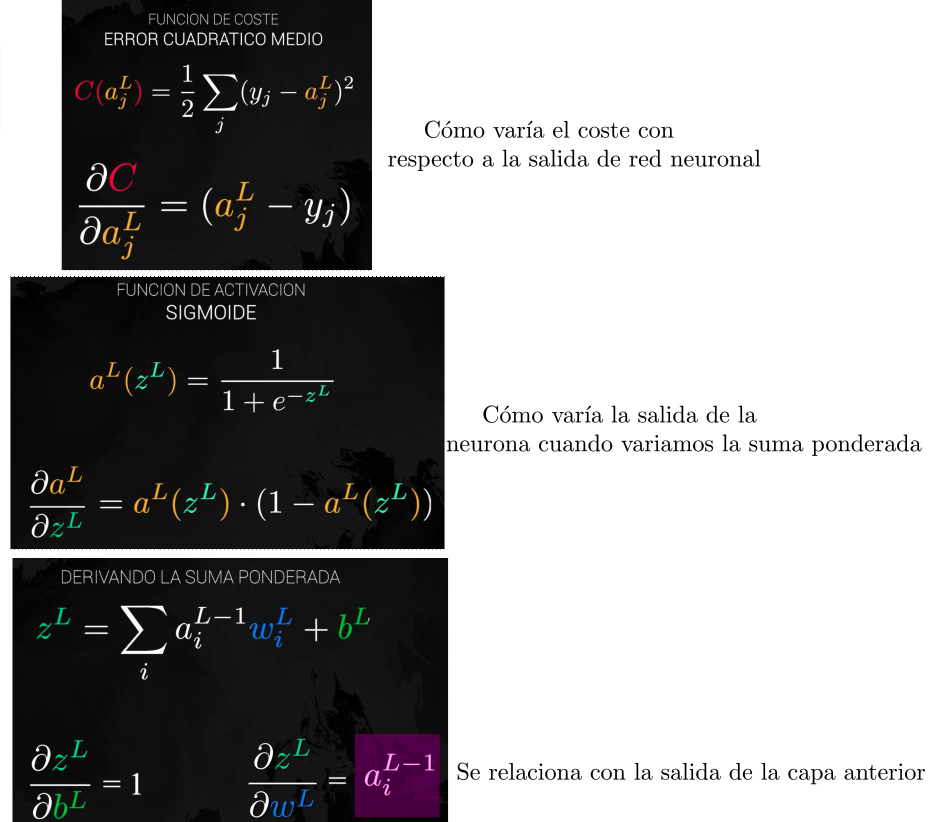

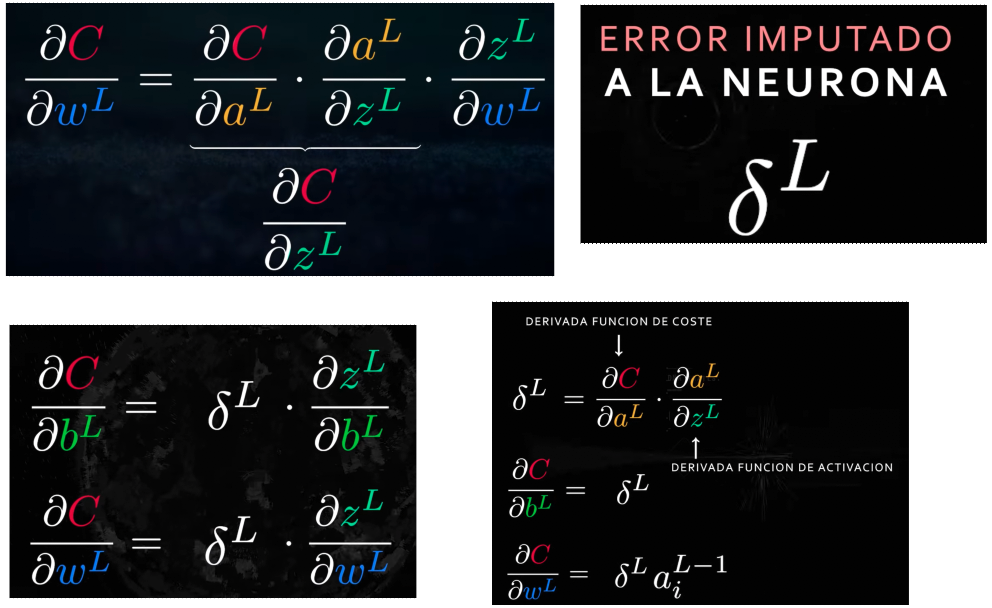

### 2. Analicemos la capa $L-1$

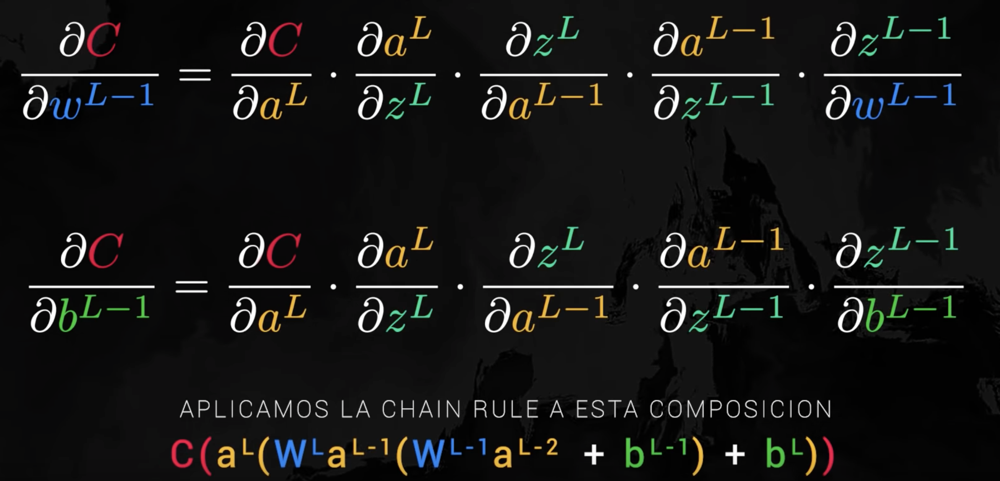
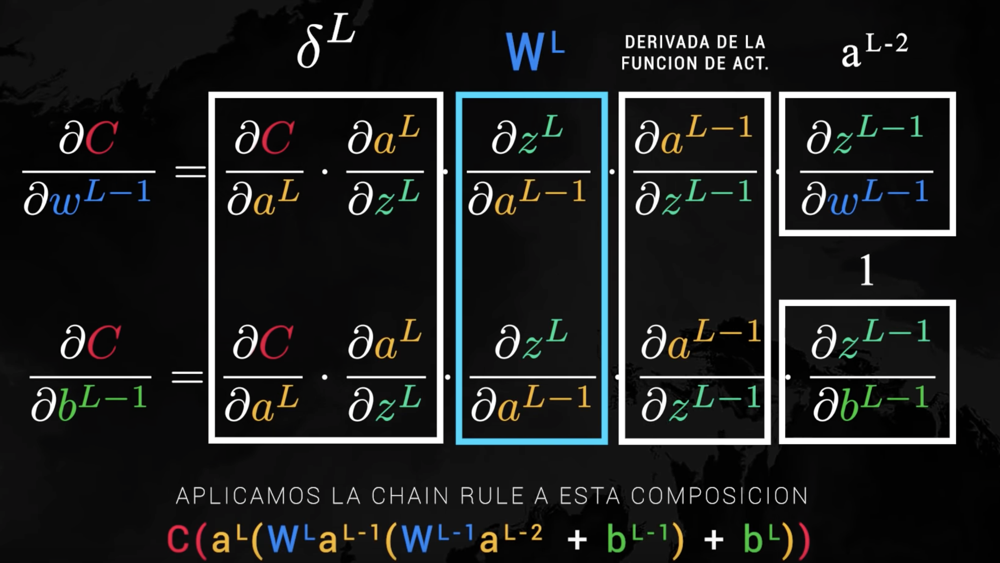

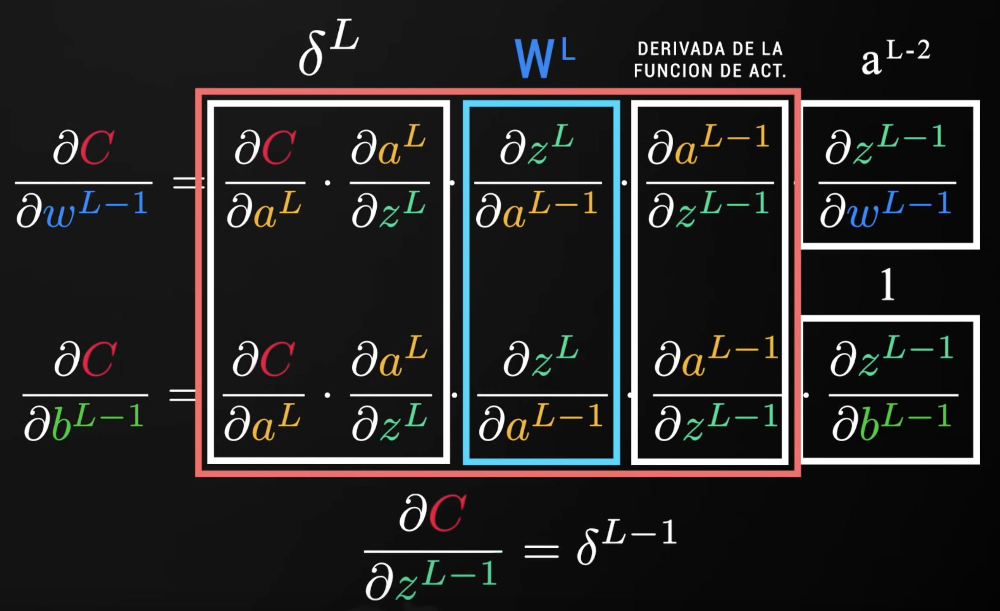

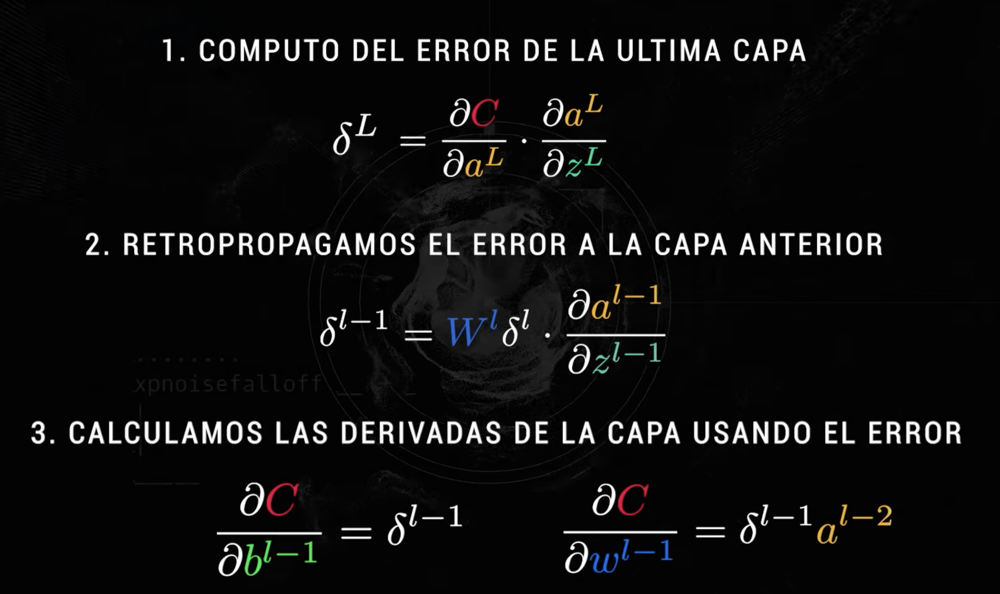

Instalar `tensorflow` en caso de que aún no lo tengan instalado seguir el siguiente procedimiento:

1. Abrir una terminal en los sistemas `macos` o `linux` y activar el ambiente de anaconda (en caso que no esté activado), con el siguiente comando:
```
conda activate
```
lo cual en la terminal se debe de mostrar de la siguiente forma:
![imagen.png](attachment:imagen.png)

    - En el caso de `windows` sólo es necesario abrir `Anaconda prompt` y ejecutar el comando descrito en el punto 1.

2. Dentro del entorno de anaconda activado, o dentro de `Anaconda prompt`, instale tensorflow usando pip. El procedimiento puede llevar algún tiempo debido a la descarga de paquetes y bibliotecas.
```
pip install tensorflow
```
Una vez finalizada la instalación, apague `Anaconda prompt` o desde la terminal sólo cierre la terminal utilizada antes de continuar al siguiente paso.

3. Si antes de la instalación se está ejecutando `jupyter` proceda a cerrarlo y a reiniciar anaconda.

4. Abra nuevamente su jupyter y cerciórese que tensorflow está intalado con el siguiente comando:

In [1]:
%pip list --format=columns

Package                       Version
----------------------------- --------------
absl-py                       1.4.0
aiohttp                       3.9.0
aiosignal                     1.2.0
alabaster                     0.7.12
alembic                       1.8.1
anaconda-anon-usage           0.4.3
anaconda-client               1.12.2
anaconda-cloud-auth           0.1.4
anaconda-navigator            2.5.2
anaconda-project              0.11.1
anyio                         4.2.0
appdirs                       1.4.4
applaunchservices             0.3.0
appnope                       0.1.2
appscript                     1.1.2
archspec                      0.2.1
argon2-cffi                   21.3.0
argon2-cffi-bindings          21.2.0
arrow                         1.2.3
astroid                       2.14.2
astropy                       5.3.4
asttokens                     2.0.5
astunparse                    1.6.3
async-lru                     2.0.4
async-timeout                 4.0.3
atomicwrite

Note: you may need to restart the kernel to use updated packages.


In [2]:
%pip show tensorflow

Name: tensorflow
Version: 2.11.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /Users/user/opt/anaconda3/lib/python3.9/site-packages
Requires: absl-py, astunparse, flatbuffers, gast, google-pasta, grpcio, h5py, keras, libclang, numpy, opt-einsum, packaging, protobuf, setuptools, six, tensorboard, tensorflow-estimator, tensorflow-io-gcs-filesystem, termcolor, typing-extensions, wrapt
Required-by: 
Note: you may need to restart the kernel to use updated packages.


Con los pasos anteriores estamos listos para comenzar a utilizar tensorflow para la programación de nuestras redes neuronales.

# 1. Modelos univariados para la construcción de modelos de MLP

Como vimos en clases pasadas recordemos que los pasos que debemos de realizar para entrenar modelos MLP se divide en dos partes:
1. Preparación de los datos.
2. Modelar los datos usando el modelo MLP.

## 1.1 Preparación de los datos
Recordemos que si tenemos datos univariados tendremos un vector de muestras, lo cuál nos indica que debemos transformar estos datos a un problema supervisado ($X, y$). Para esto vamos a usar la función que desarrollamos en la clase 8

In [1]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sn

2024-02-22 20:32:52.001059: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
# dividir una secuencia univariada en muestras
def split_univariate_sequence(sequence, n_steps):
    X, y = list(), list()
    for i in range(len(sequence)):
        # encontrar el final de este patrón
        end_ix = i + n_steps
        
        # comprobar si estamos más allá de la secuencia
        if end_ix > len(sequence)-1:
            break
        # reunir partes de entrada y salida del patrón
        seq_x, seq_y = sequence[i:end_ix], sequence[end_ix]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

Con esta función vamos definir una secuencia de datos y transformarla adecuadamente:

In [3]:
# Definir la secuencia de entrada
raw_seq = [10, 20, 30, 40, 50, 60, 70, 80, 90]
# Elegir un número de pasos de tiempo
n_steps = 3
# Dividir en muestras
X, y = split_univariate_sequence(raw_seq, n_steps)

print('X', X, 'y', y, sep='\n')

X
[[10 20 30]
 [20 30 40]
 [30 40 50]
 [40 50 60]
 [50 60 70]
 [60 70 80]]
y
[40 50 60 70 80 90]


## 1.2 Modelado

Un modelo MLP simple tiene una sola o varias capas ocultas de nodos interconectadas y una capa de salida que se usa para hacer una predicción. Podemos definir un MLP para el pronóstico de series de tiempo univariante de la siguiente manera.

In [5]:
# Definimos el modelo

# Modelo con la siguiente característica: Modelo Sequential
# 0. Una capa Input con entrada con n_steps
# 1. Una sóla capa oculta con 100 neuronas y relu como función de activación (layers -> Dense)
# 2. Una capa de salida Dense sin función de activación
model1 = tf.keras.Sequential([
    tf.keras.layers.Input(shape=n_steps),
    tf.keras.layers.Dense(100, activation='relu'),
    tf.keras.layers.Dense(1)
])

# Compilar el modelo y definir métricas (tf.metrics) y funciones de pérdida (mae) valor a minimizar
model1.compile(optimizer='adam', loss='mae', metrics=[tf.metrics.mape, tf.metrics.mae])

# Resumir el modelo compilado
model1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_2 (Dense)             (None, 100)               400       
                                                                 
 dense_3 (Dense)             (None, 1)                 101       
                                                                 
Total params: 501
Trainable params: 501
Non-trainable params: 0
_________________________________________________________________


In [6]:
# Ajustemos nuestro modelo compilado
history1 = model1.fit(X, y, epochs=1000, verbose=True)

Epoch 1/1000
1/1 [==============================] - 4s 4s/step - loss: 75.5877 - mean_absolute_percentage_error: 115.6850 - mean_absolute_error: 75.5877
Epoch 2/1000
1/1 [==============================] - 0s 30ms/step - loss: 74.4356 - mean_absolute_percentage_error: 113.9804 - mean_absolute_error: 74.4356
Epoch 3/1000
1/1 [==============================] - 0s 28ms/step - loss: 73.2935 - mean_absolute_percentage_error: 112.2892 - mean_absolute_error: 73.2935
Epoch 4/1000
1/1 [==============================] - 0s 44ms/step - loss: 72.1515 - mean_absolute_percentage_error: 110.6011 - mean_absolute_error: 72.1515
Epoch 5/1000
1/1 [==============================] - 0s 38ms/step - loss: 71.0194 - mean_absolute_percentage_error: 108.9288 - mean_absolute_error: 71.0194
Epoch 6/1000
1/1 [==============================] - 0s 39ms/step - loss: 69.8946 - mean_absolute_percentage_error: 107.2664 - mean_absolute_error: 69.8946
Epoch 7/1000
1/1 [==============================] - 0s 41ms/step - loss:

1/1 [==============================] - 0s 49ms/step - loss: 15.7616 - mean_absolute_percentage_error: 26.7988 - mean_absolute_error: 15.7616
Epoch 54/1000
1/1 [==============================] - 0s 51ms/step - loss: 14.4878 - mean_absolute_percentage_error: 24.8990 - mean_absolute_error: 14.4878
Epoch 55/1000
1/1 [==============================] - 0s 51ms/step - loss: 13.2080 - mean_absolute_percentage_error: 22.9909 - mean_absolute_error: 13.2080
Epoch 56/1000
1/1 [==============================] - 0s 50ms/step - loss: 11.9212 - mean_absolute_percentage_error: 21.0733 - mean_absolute_error: 11.9212
Epoch 57/1000
1/1 [==============================] - 0s 52ms/step - loss: 10.6245 - mean_absolute_percentage_error: 19.1410 - mean_absolute_error: 10.6245
Epoch 58/1000
1/1 [==============================] - 0s 55ms/step - loss: 9.3181 - mean_absolute_percentage_error: 17.1947 - mean_absolute_error: 9.3181
Epoch 59/1000
1/1 [==============================] - 0s 30ms/step - loss: 8.0026 - mea

1/1 [==============================] - 0s 75ms/step - loss: 5.4695 - mean_absolute_percentage_error: 10.6944 - mean_absolute_error: 5.4695
Epoch 107/1000
1/1 [==============================] - 0s 124ms/step - loss: 5.4575 - mean_absolute_percentage_error: 10.6424 - mean_absolute_error: 5.4575
Epoch 108/1000
1/1 [==============================] - 0s 48ms/step - loss: 5.4456 - mean_absolute_percentage_error: 10.5910 - mean_absolute_error: 5.4456
Epoch 109/1000
1/1 [==============================] - 0s 52ms/step - loss: 5.4337 - mean_absolute_percentage_error: 10.5401 - mean_absolute_error: 5.4337
Epoch 110/1000
1/1 [==============================] - 0s 51ms/step - loss: 5.4219 - mean_absolute_percentage_error: 10.4896 - mean_absolute_error: 5.4219
Epoch 111/1000
1/1 [==============================] - 0s 49ms/step - loss: 5.4100 - mean_absolute_percentage_error: 10.4395 - mean_absolute_error: 5.4100
Epoch 112/1000
1/1 [==============================] - 0s 66ms/step - loss: 5.3981 - mean_a

1/1 [==============================] - 0s 40ms/step - loss: 4.9439 - mean_absolute_percentage_error: 9.2064 - mean_absolute_error: 4.9439
Epoch 160/1000
1/1 [==============================] - 0s 42ms/step - loss: 4.9331 - mean_absolute_percentage_error: 9.1777 - mean_absolute_error: 4.9331
Epoch 161/1000
1/1 [==============================] - 0s 40ms/step - loss: 4.9219 - mean_absolute_percentage_error: 9.1461 - mean_absolute_error: 4.9219
Epoch 162/1000
1/1 [==============================] - 0s 41ms/step - loss: 4.9103 - mean_absolute_percentage_error: 9.1120 - mean_absolute_error: 4.9103
Epoch 163/1000
1/1 [==============================] - 0s 44ms/step - loss: 4.8984 - mean_absolute_percentage_error: 9.0755 - mean_absolute_error: 4.8984
Epoch 164/1000
1/1 [==============================] - 0s 31ms/step - loss: 4.9038 - mean_absolute_percentage_error: 9.0618 - mean_absolute_error: 4.9038
Epoch 165/1000
1/1 [==============================] - 0s 42ms/step - loss: 4.8855 - mean_absolute

1/1 [==============================] - 0s 29ms/step - loss: 4.3610 - mean_absolute_percentage_error: 8.0763 - mean_absolute_error: 4.3610
Epoch 213/1000
1/1 [==============================] - 0s 32ms/step - loss: 4.3503 - mean_absolute_percentage_error: 8.0653 - mean_absolute_error: 4.3503
Epoch 214/1000
1/1 [==============================] - 0s 33ms/step - loss: 4.3388 - mean_absolute_percentage_error: 8.0483 - mean_absolute_error: 4.3388
Epoch 215/1000
1/1 [==============================] - 0s 46ms/step - loss: 4.3266 - mean_absolute_percentage_error: 8.0259 - mean_absolute_error: 4.3266
Epoch 216/1000
1/1 [==============================] - 0s 32ms/step - loss: 4.3137 - mean_absolute_percentage_error: 7.9984 - mean_absolute_error: 4.3137
Epoch 217/1000
1/1 [==============================] - 0s 44ms/step - loss: 4.3002 - mean_absolute_percentage_error: 7.9665 - mean_absolute_error: 4.3002
Epoch 218/1000
1/1 [==============================] - 0s 43ms/step - loss: 4.2870 - mean_absolute

1/1 [==============================] - 0s 34ms/step - loss: 3.6511 - mean_absolute_percentage_error: 6.8668 - mean_absolute_error: 3.6511
Epoch 266/1000
1/1 [==============================] - 0s 31ms/step - loss: 3.6355 - mean_absolute_percentage_error: 6.8467 - mean_absolute_error: 3.6355
Epoch 267/1000
1/1 [==============================] - 0s 29ms/step - loss: 3.6207 - mean_absolute_percentage_error: 6.8212 - mean_absolute_error: 3.6207
Epoch 268/1000
1/1 [==============================] - 0s 40ms/step - loss: 3.6051 - mean_absolute_percentage_error: 6.7892 - mean_absolute_error: 3.6051
Epoch 269/1000
1/1 [==============================] - 0s 40ms/step - loss: 3.5885 - mean_absolute_percentage_error: 6.7511 - mean_absolute_error: 3.5885
Epoch 270/1000
1/1 [==============================] - 0s 41ms/step - loss: 3.5712 - mean_absolute_percentage_error: 6.7076 - mean_absolute_error: 3.5712
Epoch 271/1000
1/1 [==============================] - 0s 40ms/step - loss: 3.5532 - mean_absolute

1/1 [==============================] - 0s 28ms/step - loss: 2.7225 - mean_absolute_percentage_error: 5.0389 - mean_absolute_error: 2.7225
Epoch 319/1000
1/1 [==============================] - 0s 30ms/step - loss: 2.7134 - mean_absolute_percentage_error: 5.0013 - mean_absolute_error: 2.7134
Epoch 320/1000
1/1 [==============================] - 0s 44ms/step - loss: 2.6855 - mean_absolute_percentage_error: 4.9792 - mean_absolute_error: 2.6855
Epoch 321/1000
1/1 [==============================] - 0s 34ms/step - loss: 2.6688 - mean_absolute_percentage_error: 4.9646 - mean_absolute_error: 2.6688
Epoch 322/1000
1/1 [==============================] - 0s 32ms/step - loss: 2.6509 - mean_absolute_percentage_error: 4.9404 - mean_absolute_error: 2.6509
Epoch 323/1000
1/1 [==============================] - 0s 43ms/step - loss: 2.6317 - mean_absolute_percentage_error: 4.9073 - mean_absolute_error: 2.6317
Epoch 324/1000
1/1 [==============================] - 0s 45ms/step - loss: 2.6115 - mean_absolute

1/1 [==============================] - 0s 44ms/step - loss: 1.5961 - mean_absolute_percentage_error: 2.9660 - mean_absolute_error: 1.5961
Epoch 372/1000
1/1 [==============================] - 0s 36ms/step - loss: 1.5769 - mean_absolute_percentage_error: 2.9058 - mean_absolute_error: 1.5769
Epoch 373/1000
1/1 [==============================] - 0s 29ms/step - loss: 1.5496 - mean_absolute_percentage_error: 2.8845 - mean_absolute_error: 1.5496
Epoch 374/1000
1/1 [==============================] - 0s 29ms/step - loss: 1.5287 - mean_absolute_percentage_error: 2.8625 - mean_absolute_error: 1.5287
Epoch 375/1000
1/1 [==============================] - 0s 47ms/step - loss: 1.5063 - mean_absolute_percentage_error: 2.8293 - mean_absolute_error: 1.5063
Epoch 376/1000
1/1 [==============================] - 0s 30ms/step - loss: 1.4825 - mean_absolute_percentage_error: 2.7860 - mean_absolute_error: 1.4825
Epoch 377/1000
1/1 [==============================] - 0s 33ms/step - loss: 1.4574 - mean_absolute

1/1 [==============================] - 0s 29ms/step - loss: 0.3217 - mean_absolute_percentage_error: 0.6109 - mean_absolute_error: 0.3217
Epoch 425/1000
1/1 [==============================] - 0s 27ms/step - loss: 0.2117 - mean_absolute_percentage_error: 0.3769 - mean_absolute_error: 0.2117
Epoch 426/1000
1/1 [==============================] - 0s 28ms/step - loss: 0.2141 - mean_absolute_percentage_error: 0.3436 - mean_absolute_error: 0.2141
Epoch 427/1000
1/1 [==============================] - 0s 38ms/step - loss: 0.1605 - mean_absolute_percentage_error: 0.2833 - mean_absolute_error: 0.1605
Epoch 428/1000
1/1 [==============================] - 0s 28ms/step - loss: 0.2552 - mean_absolute_percentage_error: 0.4533 - mean_absolute_error: 0.2552
Epoch 429/1000
1/1 [==============================] - 0s 27ms/step - loss: 0.1250 - mean_absolute_percentage_error: 0.1992 - mean_absolute_error: 0.1250
Epoch 430/1000
1/1 [==============================] - 0s 28ms/step - loss: 0.1709 - mean_absolute

1/1 [==============================] - 0s 45ms/step - loss: 1.0881 - mean_absolute_percentage_error: 1.5976 - mean_absolute_error: 1.0881
Epoch 478/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.8521 - mean_absolute_percentage_error: 1.2452 - mean_absolute_error: 0.8521
Epoch 479/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.3356 - mean_absolute_percentage_error: 0.4743 - mean_absolute_error: 0.3356
Epoch 480/1000
1/1 [==============================] - 0s 62ms/step - loss: 0.4280 - mean_absolute_percentage_error: 0.6652 - mean_absolute_error: 0.4280
Epoch 481/1000
1/1 [==============================] - 0s 70ms/step - loss: 0.8104 - mean_absolute_percentage_error: 1.2359 - mean_absolute_error: 0.8104
Epoch 482/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.8552 - mean_absolute_percentage_error: 1.3030 - mean_absolute_error: 0.8552
Epoch 483/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.5998 - mean_absolute

1/1 [==============================] - 0s 41ms/step - loss: 0.0273 - mean_absolute_percentage_error: 0.0557 - mean_absolute_error: 0.0273
Epoch 531/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.0528 - mean_absolute_percentage_error: 0.0953 - mean_absolute_error: 0.0528
Epoch 532/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.1574 - mean_absolute_percentage_error: 0.2211 - mean_absolute_error: 0.1574
Epoch 533/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.1038 - mean_absolute_percentage_error: 0.1474 - mean_absolute_error: 0.1038
Epoch 534/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.1589 - mean_absolute_percentage_error: 0.2454 - mean_absolute_error: 0.1589
Epoch 535/1000
1/1 [==============================] - 0s 32ms/step - loss: 0.1468 - mean_absolute_percentage_error: 0.2248 - mean_absolute_error: 0.1468
Epoch 536/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.1079 - mean_absolute

1/1 [==============================] - 0s 43ms/step - loss: 0.0339 - mean_absolute_percentage_error: 0.0636 - mean_absolute_error: 0.0339
Epoch 584/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.0294 - mean_absolute_percentage_error: 0.0550 - mean_absolute_error: 0.0294
Epoch 585/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.0901 - mean_absolute_percentage_error: 0.1226 - mean_absolute_error: 0.0901
Epoch 586/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.0278 - mean_absolute_percentage_error: 0.0514 - mean_absolute_error: 0.0278
Epoch 587/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.0248 - mean_absolute_percentage_error: 0.0453 - mean_absolute_error: 0.0248
Epoch 588/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.0860 - mean_absolute_percentage_error: 0.1216 - mean_absolute_error: 0.0860
Epoch 589/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.0334 - mean_absolute

1/1 [==============================] - 0s 42ms/step - loss: 0.3175 - mean_absolute_percentage_error: 0.4796 - mean_absolute_error: 0.3175
Epoch 637/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.4159 - mean_absolute_percentage_error: 0.6262 - mean_absolute_error: 0.4159
Epoch 638/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.3022 - mean_absolute_percentage_error: 0.4563 - mean_absolute_error: 0.3022
Epoch 639/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.0132 - mean_absolute_percentage_error: 0.0202 - mean_absolute_error: 0.0132
Epoch 640/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.2110 - mean_absolute_percentage_error: 0.3110 - mean_absolute_error: 0.2110
Epoch 641/1000
1/1 [==============================] - 0s 28ms/step - loss: 0.1983 - mean_absolute_percentage_error: 0.2929 - mean_absolute_error: 0.1983
Epoch 642/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.0139 - mean_absolute

1/1 [==============================] - 0s 28ms/step - loss: 0.3570 - mean_absolute_percentage_error: 0.5312 - mean_absolute_error: 0.3570
Epoch 690/1000
1/1 [==============================] - 0s 28ms/step - loss: 0.5542 - mean_absolute_percentage_error: 0.8251 - mean_absolute_error: 0.5542
Epoch 691/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.5405 - mean_absolute_percentage_error: 0.8044 - mean_absolute_error: 0.5405
Epoch 692/1000
1/1 [==============================] - 0s 40ms/step - loss: 0.3374 - mean_absolute_percentage_error: 0.5010 - mean_absolute_error: 0.3374
Epoch 693/1000
1/1 [==============================] - 0s 42ms/step - loss: 0.0352 - mean_absolute_percentage_error: 0.0553 - mean_absolute_error: 0.0352
Epoch 694/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.1803 - mean_absolute_percentage_error: 0.2720 - mean_absolute_error: 0.1803
Epoch 695/1000
1/1 [==============================] - 0s 34ms/step - loss: 0.1214 - mean_absolute

1/1 [==============================] - 0s 30ms/step - loss: 0.2308 - mean_absolute_percentage_error: 0.3407 - mean_absolute_error: 0.2308
Epoch 743/1000
1/1 [==============================] - 0s 44ms/step - loss: 0.1170 - mean_absolute_percentage_error: 0.1709 - mean_absolute_error: 0.1170
Epoch 744/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.1663 - mean_absolute_percentage_error: 0.2520 - mean_absolute_error: 0.1663
Epoch 745/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.2402 - mean_absolute_percentage_error: 0.3621 - mean_absolute_error: 0.2402
Epoch 746/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.1255 - mean_absolute_percentage_error: 0.1910 - mean_absolute_error: 0.1255
Epoch 747/1000
1/1 [==============================] - 0s 27ms/step - loss: 0.1582 - mean_absolute_percentage_error: 0.2325 - mean_absolute_error: 0.1582
Epoch 748/1000
1/1 [==============================] - 0s 28ms/step - loss: 0.2329 - mean_absolute

1/1 [==============================] - 0s 29ms/step - loss: 0.1935 - mean_absolute_percentage_error: 0.2870 - mean_absolute_error: 0.1935
Epoch 796/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.2657 - mean_absolute_percentage_error: 0.3949 - mean_absolute_error: 0.2657
Epoch 797/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.1571 - mean_absolute_percentage_error: 0.2328 - mean_absolute_error: 0.1571
Epoch 798/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.1143 - mean_absolute_percentage_error: 0.1722 - mean_absolute_error: 0.1143
Epoch 799/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1847 - mean_absolute_percentage_error: 0.2773 - mean_absolute_error: 0.1847
Epoch 800/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.0744 - mean_absolute_percentage_error: 0.1127 - mean_absolute_error: 0.0744
Epoch 801/1000
1/1 [==============================] - 0s 28ms/step - loss: 0.1981 - mean_absolute

1/1 [==============================] - 0s 38ms/step - loss: 0.0305 - mean_absolute_percentage_error: 0.0452 - mean_absolute_error: 0.0305
Epoch 849/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.2340 - mean_absolute_percentage_error: 0.3495 - mean_absolute_error: 0.2340
Epoch 850/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.3037 - mean_absolute_percentage_error: 0.4537 - mean_absolute_error: 0.3037
Epoch 851/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.1987 - mean_absolute_percentage_error: 0.2970 - mean_absolute_error: 0.1987
Epoch 852/1000
1/1 [==============================] - 0s 29ms/step - loss: 0.0637 - mean_absolute_percentage_error: 0.0946 - mean_absolute_error: 0.0637
Epoch 853/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.1318 - mean_absolute_percentage_error: 0.1962 - mean_absolute_error: 0.1318
Epoch 854/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.0252 - mean_absolute

1/1 [==============================] - 0s 29ms/step - loss: 0.1028 - mean_absolute_percentage_error: 0.1476 - mean_absolute_error: 0.1028
Epoch 902/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.0658 - mean_absolute_percentage_error: 0.1044 - mean_absolute_error: 0.0658
Epoch 903/1000
1/1 [==============================] - 0s 41ms/step - loss: 0.0534 - mean_absolute_percentage_error: 0.0863 - mean_absolute_error: 0.0534
Epoch 904/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.1215 - mean_absolute_percentage_error: 0.1747 - mean_absolute_error: 0.1215
Epoch 905/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.1150 - mean_absolute_percentage_error: 0.1648 - mean_absolute_error: 0.1150
Epoch 906/1000
1/1 [==============================] - 0s 28ms/step - loss: 0.0546 - mean_absolute_percentage_error: 0.0887 - mean_absolute_error: 0.0546
Epoch 907/1000
1/1 [==============================] - 0s 45ms/step - loss: 0.0436 - mean_absolute

1/1 [==============================] - 0s 41ms/step - loss: 0.0487 - mean_absolute_percentage_error: 0.0823 - mean_absolute_error: 0.0487
Epoch 955/1000
1/1 [==============================] - 0s 43ms/step - loss: 0.0402 - mean_absolute_percentage_error: 0.0697 - mean_absolute_error: 0.0402
Epoch 956/1000
1/1 [==============================] - 0s 30ms/step - loss: 0.1277 - mean_absolute_percentage_error: 0.1809 - mean_absolute_error: 0.1277
Epoch 957/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.1184 - mean_absolute_percentage_error: 0.1671 - mean_absolute_error: 0.1184
Epoch 958/1000
1/1 [==============================] - 0s 31ms/step - loss: 0.0501 - mean_absolute_percentage_error: 0.0845 - mean_absolute_error: 0.0501
Epoch 959/1000
1/1 [==============================] - 0s 47ms/step - loss: 0.0417 - mean_absolute_percentage_error: 0.0719 - mean_absolute_error: 0.0417
Epoch 960/1000
1/1 [==============================] - 0s 33ms/step - loss: 0.1259 - mean_absolute

In [7]:
# Atributo history
history1.history.keys()

dict_keys(['loss', 'mean_absolute_percentage_error', 'mean_absolute_error'])

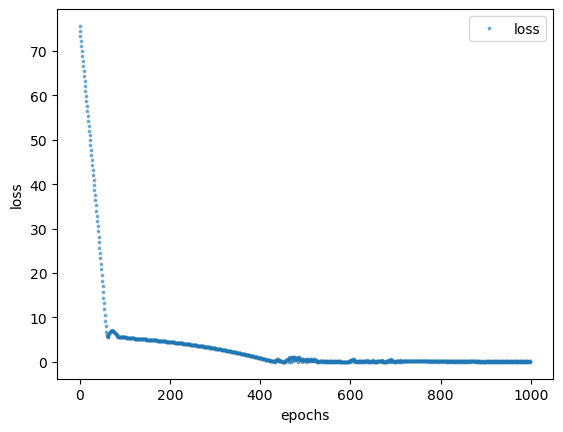

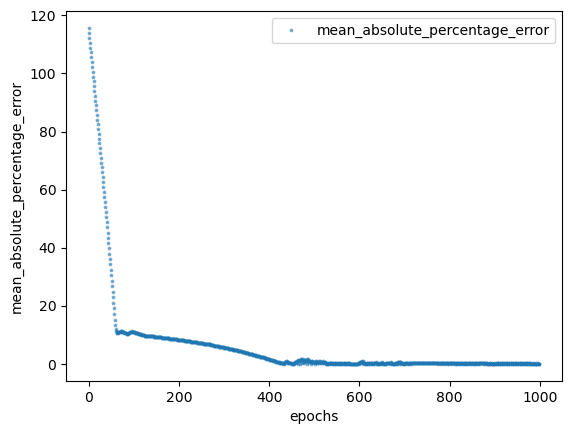

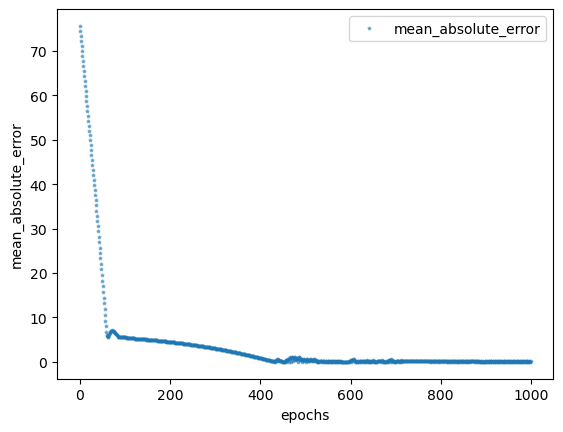

In [16]:
# Analizar función de pérdida
variable = ['loss', 'mean_absolute_percentage_error', 'mean_absolute_error']
for var in variable:
    plt.plot(history1.history[var], '*', ms=2.5, alpha=.5, label=var)
    plt.legend()
    plt.xlabel('epochs')
    plt.ylabel(var)
    plt.show()

In [21]:
# Como cambiar un vector 1D a 2D
x_input = np.array([70, 80, 90])
x_input = x_input.reshape(1, -1)
x_input.shape

(1, 3)

In [22]:
# Realizar predicciones con nuestro modelo
x_input = np.array([70, 80, 90])
x_input = x_input.reshape(1, -1)

y_hat = model1.predict(x_input, verbose=0)
y_hat

array([[100.358185]], dtype=float32)

# 2. Modelos multivariable para la construcción de modelos de MLP


## 2.1 Preparar los datos 

Un problema puede tener dos o más series temporales de entrada paralelas y una serie temporal de salida que depende de las series temporales de entrada. Las series temporales de entrada son paralelas porque cada serie tiene una observación en el mismo paso temporal. Podemos demostrarlo con un ejemplo sencillo de dos series temporales de entrada paralelas en las que la serie de salida es la simple suma de las series de entrada

In [23]:
# Definir secuencias de entrada
in_seq1 = np.array([10, 20, 30, 40, 50, 60, 70, 80, 90])
in_seq2 = np.array([15, 25, 35, 45, 55, 65, 75, 85, 95])
output_seq = in_seq1 + in_seq2

in_seq1.shape, output_seq.shape

((9,), (9,))

In [24]:
# Vamos a poner toda esta información en forma matricial 2D
# Para ello tenemos que definir el shape de cada secuencia
in_seq1 = in_seq1.reshape(-1, 1)
in_seq2 = in_seq2.reshape(-1, 1)
output_seq = output_seq.reshape(-1, 1)

in_seq1.shape, output_seq.shape

((9, 1), (9, 1))

In [25]:
# ver las secuencias
print(in_seq1), print(in_seq2)

[[10]
 [20]
 [30]
 [40]
 [50]
 [60]
 [70]
 [80]
 [90]]
[[15]
 [25]
 [35]
 [45]
 [55]
 [65]
 [75]
 [85]
 [95]]


(None, None)

In [26]:
# Concatenar horizontalmente nuestra data np.hstack
dataset = np.hstack([in_seq1, in_seq2, output_seq])
dataset

array([[ 10,  15,  25],
       [ 20,  25,  45],
       [ 30,  35,  65],
       [ 40,  45,  85],
       [ 50,  55, 105],
       [ 60,  65, 125],
       [ 70,  75, 145],
       [ 80,  85, 165],
       [ 90,  95, 185]])

In [27]:
dataset.shape

(9, 3)

Como vimos en las secciones previas, necesitamos transformar nuestra data a un tensor. Es decir nuestros datos de entrada deben de tener la siguiente característica. La primera dimensión es el **número de muestras**, en este caso 7. La segunda dimensión es el **número de pasos temporales por muestra**, en este caso 3, el valor especificado a la función. Finalmente, la última dimensión especifica el número de series temporales paralelas o el **número de variables**, en este caso 2 para las dos series paralelas.

Para poder transformar esta data de tal forma que podamos usarlo para entrenar nuestra NN, debemos modificar un poco la función `split_univariate_sequence` de la siguiente forma:

In [28]:
# dividir una secuencia multivariada en muestras
def split_multivariate_sequence(sequence: np.ndarray, n_steps: int):
    X, y = list(), list()
    for i in range(len(sequence)):
        # encontrar el final de este patrón
        end_ix = i + n_steps
        
        # comprobar si estamos más allá de la secuencia
        if end_ix > len(sequence):
            break
        # reunir partes de entrada y salida del patrón
        seq_x, seq_y = sequence[i:end_ix, :-1], sequence[end_ix - 1, -1]
        X.append(seq_x)
        y.append(seq_y)
    return np.array(X), np.array(y)

In [29]:
n_steps = 3
X, y = split_multivariate_sequence(dataset, n_steps)

X.shape, y.shape

((7, 3, 2), (7,))

In [30]:
# Imprimir mis datos resultantes
[print(X[i], y[i]) for i in range(X.shape[0])]

[[10 15]
 [20 25]
 [30 35]] 65
[[20 25]
 [30 35]
 [40 45]] 85
[[30 35]
 [40 45]
 [50 55]] 105
[[40 45]
 [50 55]
 [60 65]] 125
[[50 55]
 [60 65]
 [70 75]] 145
[[60 65]
 [70 75]
 [80 85]] 165
[[70 75]
 [80 85]
 [90 95]] 185


[None, None, None, None, None, None, None]

## 2.2 Modelo MLP
Como por cada paso de tiempo tendremos una matriz, tendremos que volverla un vector. Es decir si tenemos 
```
[[10 15]
[20 25]    -------> [10, 15, 20, 25, 30, 35]
[30 35]]
```

In [31]:
X[0], X.shape

(array([[10, 15],
        [20, 25],
        [30, 35]]),
 (7, 3, 2))

In [32]:
# flatten input
n_input = X.shape[1] * X.shape[2]
X = X.reshape((X.shape[0], n_input))
X.shape

(7, 6)

In [33]:
print(X)

[[10 15 20 25 30 35]
 [20 25 30 35 40 45]
 [30 35 40 45 50 55]
 [40 45 50 55 60 65]
 [50 55 60 65 70 75]
 [60 65 70 75 80 85]
 [70 75 80 85 90 95]]


In [34]:
# Definimos el modelo

# Modelo con una sóla capa oculta de 100 neuronas y atributo input_shape
model2 = keras.models.Sequential([
    keras.layers.Dense(units=100, activation='relu', input_shape=(n_input,)),
    keras.layers.Dense(1)
])

# Compilar el modelo y definir métricas y funciones de pérdida
model2.compile(optimizer='adam', loss=['mse'], metrics=['mape'])

# Resumir el modelo compilado
model2.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 100)               700       
                                                                 
 dense_5 (Dense)             (None, 1)                 101       
                                                                 
Total params: 801
Trainable params: 801
Non-trainable params: 0
_________________________________________________________________


In [35]:
# Ajustemos nuestro modelo compilado
history2 = model2.fit(X, y, epochs=1000, verbose=False)

In [36]:
history2.history.keys()

dict_keys(['loss', 'mape'])

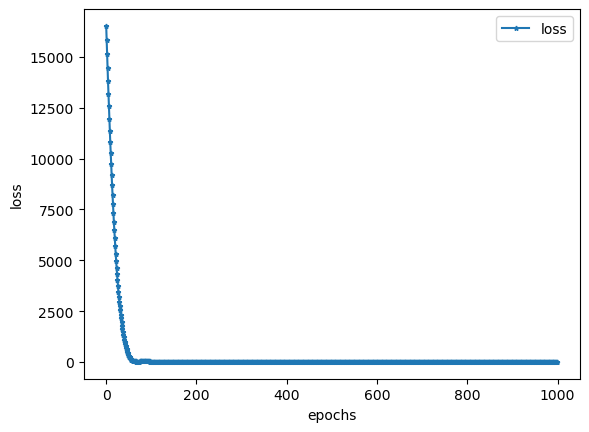

In [37]:
# Analizar función de pérdida
plt.plot(history2.history['loss'], '-*', label='loss', markersize=3.5)
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend()

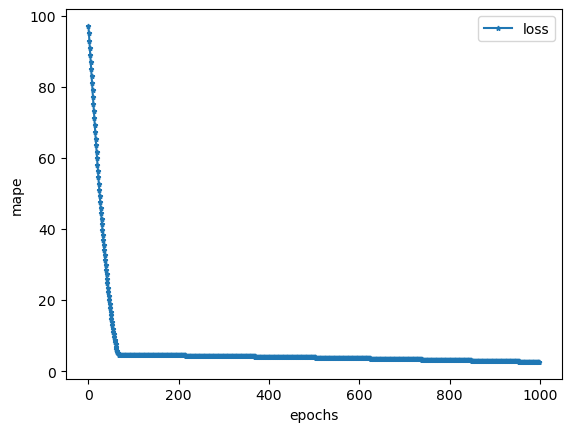

In [38]:
# Analizar función de pérdida
plt.plot(history2.history['mape'], '-*', label='loss', markersize=3.5)
plt.xlabel('epochs')
plt.ylabel('mape')
plt.legend()

In [40]:
x_input = np.array([[80, 85], [90, 95], [100, 105]])
x_input.reshape((1, n_input))

array([[ 80,  85,  90,  95, 100, 105]])

In [41]:
# Ver la prediccion
x_input = np.array([[80, 85], [90, 95], [100, 105]])
x_input = x_input.reshape((1, n_input))
yhat = model2.predict(x_input, verbose=0)
print(yhat)

[[209.44598]]


# Nota acerca de dropout

No es necesario aplicar dropout en cada capa para evitar el overfitting. En general, se recomienda aplicar dropout solo en capas con un gran número de parámetros y que tienen más probabilidades de sobreajustar los datos de entrenamiento.

La técnica de dropout consiste en aleatoriamente "desactivar" (eliminar temporalmente) algunas neuronas de una capa durante el entrenamiento, lo que obliga a la red a aprender características más robustas y a no depender demasiado de ninguna neurona específica. Esto puede reducir la tendencia de la red a sobreajustarse a los datos de entrenamiento.

Sin embargo, aplicar dropout en cada capa puede tener un impacto negativo en el rendimiento de la red, ya que la eliminación de neuronas en cada capa puede reducir la capacidad de la red para aprender patrones complejos. En su lugar, se recomienda aplicar dropout solo en una o dos capas intermedias, dependiendo del tamaño y complejidad de la red.

## Ejemplo
Ahora vamos a programar otra red neuronal para regresión para el siguiente dataset:

Las muestras contienen 12 atributos de casas en diferentes lugares alrededor del suburbios de Boston a fines de la década de 1970. Los objetivos son los valores medios de las casas en un lugar (en k$).

Los atributos mismos se definen en el [Sitio web de StatLib](http://lib.stat.cmu.edu/datasets/boston).

El diccionario de datos es el siguiente:

        CRIM: Per capita crime rate by town
        ZN: Proportion of residential land zoned for lots over 25,000 sq. ft
        INDUS: Proportion of non-retail business acres per town
        CHAS: Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        NOX: Nitric oxide concentration (parts per 10 million)
        RM: Average number of rooms per dwelling
        AGE: Proportion of owner-occupied units built prior to 1940
        DIS: Weighted distances to five Boston employment centers
        RAD: Index of accessibility to radial highways
        TAX: Full-value property tax rate per $10,000
    PTRATIO: Pupil-teacher ratio by town
    LSTAT: Percentage of lower status of the population
    MEDV: Median value of owner-occupied homes in $1000s
    
El objetivo para es este dataset es el siguiente:
1. Construir una red neuronal MLP univariada. Para esto, escoger la variable que más tenga correlación con la variable de salida.
2. Construir una red neuronal MLP multivariada. Para esto, tomar todas las variables incluidas en nuestro dataset.
3. Construir una red neuronal MLP multivariada, pero en este caso sólo considerar las variables adecuadas y descartar aquellas que no aportan mucha información o que son redundantes para cuantificar el efecto de estas variables redundantes.

**Nota**: Para poder saber cuales variables incluir en el modelo y cuales rechazar una opción es analizar la correlación de pearson y la otra usando pruebas estadísiticas con las siguientes paqueterías
```
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_regression
```
> Luego del paso 3, crear el mismo modelo pero en este caso implementar técnicas de regularización `EarlyStoppin` y `dropout`. Investigar como se pueden implementar estas estrategias en tensorflow.


In [42]:
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sn

# Cargar los datos de entrenamiento y prueba
(train_data, train_labels), (test_data, test_labels) = keras.datasets.boston_housing.load_data()


In [43]:
train_data.shape, test_data.shape

((404, 13), (102, 13))

In [44]:
train_data[0:3,-4:]

array([[307.  ,  21.  , 396.9 ,  18.72],
       [348.  ,  14.7 , 395.38,   3.11],
       [666.  ,  20.2 , 375.52,   3.26]])

In [45]:
# Obviar la columna -2 por que considera una variable de poco interés
np.delete(train_data, -2, axis=1)[0:3,-4:]


array([[  4.  , 307.  ,  21.  ,  18.72],
       [  2.  , 348.  ,  14.7 ,   3.11],
       [ 24.  , 666.  ,  20.2 ,   3.26]])

In [46]:
train_data = np.delete(train_data, -2, axis=1)
test_data = np.delete(test_data, -2, axis=1)

In [47]:
train_data.shape, test_data.shape

((404, 12), (102, 12))

In [48]:
train_labels.shape, test_labels.shape

((404,), (102,))

In [49]:
np.hstack([train_labels, test_labels]).shape

(506,)

In [50]:
# Analizar la data completa
columns = [
    'CRIM',
    'ZN',
    'INDUS',
    'CHAS',
    'NOX',
    'RM',
    'AGE',
    'DIS',
    'RAD',
    'TAX',
    'PTRATIO',
    'LSTAT',
    'MEDV',
]

X = np.vstack([train_data, test_data])
y = np.hstack([train_labels, test_labels]).reshape(-1, 1)
data = pd.DataFrame(np.concatenate((X, y), axis=1), columns=columns)
data

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,LSTAT,MEDV
0,1.23247,0.0,8.14,0.0,0.538,6.142,91.7,3.9769,4.0,307.0,21.0,18.72,15.2
1,0.02177,82.5,2.03,0.0,0.415,7.610,15.7,6.2700,2.0,348.0,14.7,3.11,42.3
2,4.89822,0.0,18.10,0.0,0.631,4.970,100.0,1.3325,24.0,666.0,20.2,3.26,50.0
3,0.03961,0.0,5.19,0.0,0.515,6.037,34.5,5.9853,5.0,224.0,20.2,8.01,21.1
4,3.69311,0.0,18.10,0.0,0.713,6.376,88.4,2.5671,24.0,666.0,20.2,14.65,17.7
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,3.47428,0.0,18.10,1.0,0.718,8.780,82.9,1.9047,24.0,666.0,20.2,5.29,21.9
502,0.07896,0.0,12.83,0.0,0.437,6.273,6.0,4.2515,5.0,398.0,18.7,6.78,24.1
503,1.83377,0.0,19.58,1.0,0.605,7.802,98.2,2.0407,5.0,403.0,14.7,1.92,50.0
504,0.35809,0.0,6.20,1.0,0.507,6.951,88.5,2.8617,8.0,307.0,17.4,9.71,26.7


## EDA

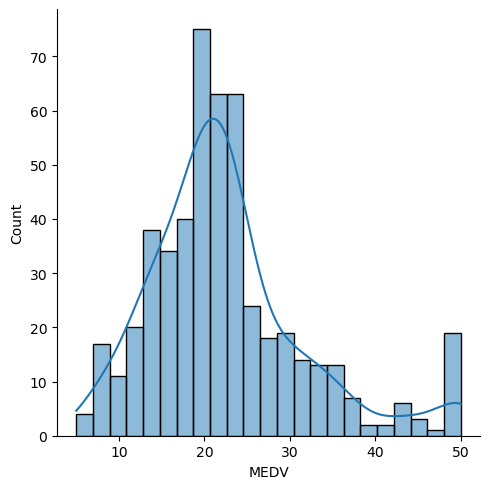

In [51]:
# Graficar la distribución de la salida (precios de viviendas) sn.distplot -> kde
sn.displot(data, x='MEDV', kde=True)

In [52]:
data.corr().round(2)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,LSTAT,MEDV
CRIM,1.00,-0.20,0.41,-0.06,0.42,-0.22,0.35,-0.38,0.63,0.58,0.29,0.46,-0.39
ZN,-0.20,1.00,-0.53,-0.04,-0.52,0.31,-0.57,0.66,-0.31,-0.31,-0.39,-0.41,0.36
INDUS,0.41,-0.53,1.00,0.06,0.76,-0.39,0.64,-0.71,0.60,0.72,0.38,0.60,-0.48
CHAS,-0.06,-0.04,0.06,1.00,0.09,0.09,0.09,-0.10,-0.01,-0.04,-0.12,-0.05,0.18
NOX,0.42,-0.52,0.76,0.09,1.00,-0.30,0.73,-0.77,0.61,0.67,0.19,0.59,-0.43
RM,-0.22,0.31,-0.39,0.09,-0.30,1.00,-0.24,0.21,-0.21,-0.29,-0.36,-0.61,0.70
AGE,0.35,-0.57,0.64,0.09,0.73,-0.24,1.00,-0.75,0.46,0.51,0.26,0.60,-0.38
DIS,-0.38,0.66,-0.71,-0.10,-0.77,0.21,-0.75,1.00,-0.49,-0.53,-0.23,-0.50,0.25
RAD,0.63,-0.31,0.60,-0.01,0.61,-0.21,0.46,-0.49,1.00,0.91,0.46,0.49,-0.38
TAX,0.58,-0.31,0.72,-0.04,0.67,-0.29,0.51,-0.53,0.91,1.00,0.46,0.54,-0.47


<Axes: >

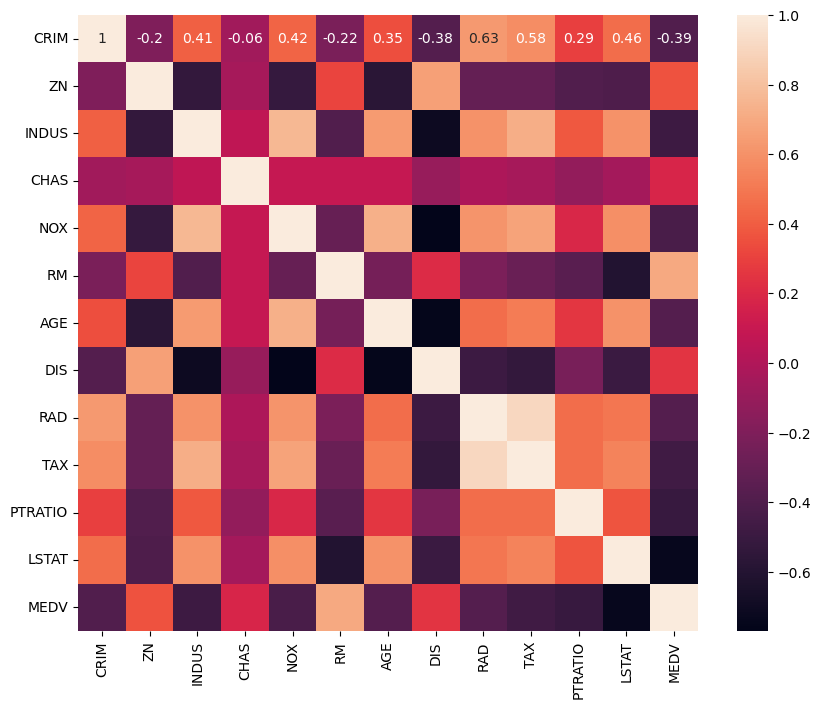

In [53]:
# Análisis de correlación (selección de features) heatmap -> annot
corr = data.corr().round(2)

fig, ax = plt.subplots(1,1, figsize=(10, 8))
sn.heatmap(corr, annot=True, ax=ax)

<Axes: xlabel='RM', ylabel='MEDV'>

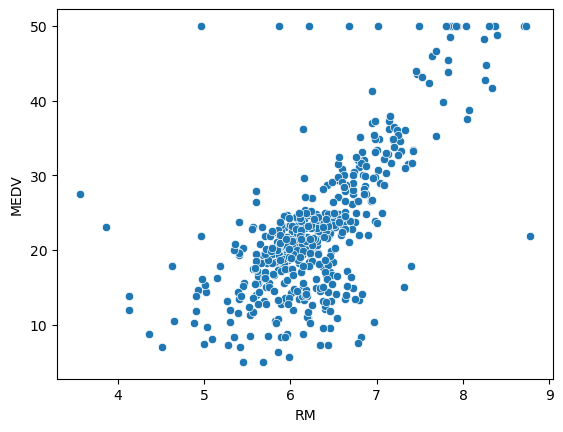

In [54]:
# Realizar un scatterplot entre la variables seleccionadas sn.scatterplot -> data, x, y
features_cols = ['RM']
output_col = ['MEDV']

sn.scatterplot(data, x=features_cols[0], y=output_col[0])

<Axes: >

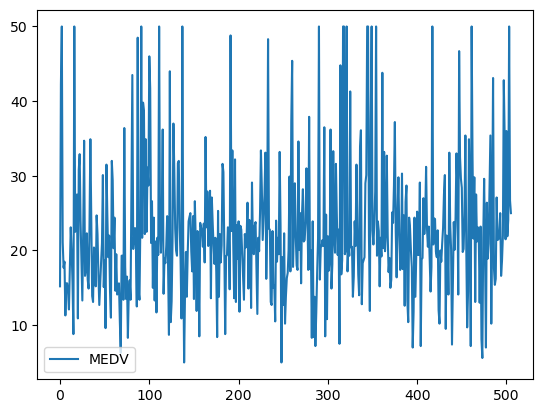

In [55]:
# Graficar la salida en el tiempo
data[output_col].plot()

<Axes: >

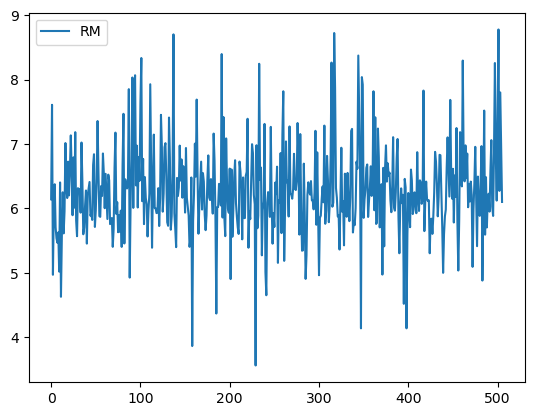

In [56]:
# Gráfica de las características en el tiempo
data[features_cols].plot()

In [61]:
data['log_rm'] = np.log(data['RM'])
data['log_medv'] = np.log(data['MEDV'])

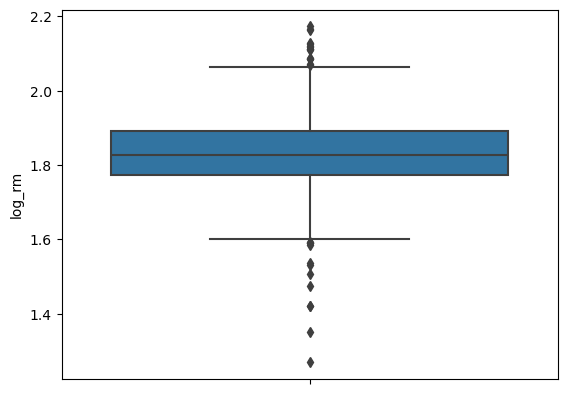

<Axes: ylabel='log_medv'>

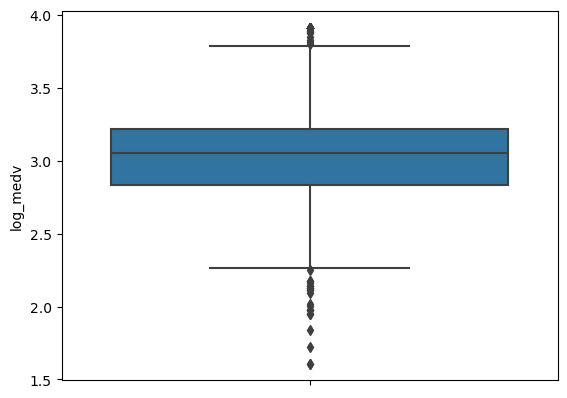

In [62]:
sn.boxplot(data, y='log_rm')
plt.show()
sn.boxplot(data, y='log_medv')

/Users/user/opt/anaconda3/lib/python3.9/site-packages/pandas/core/internals/blocks.py:351: RuntimeWarning: divide by zero encountered in log
  result = func(self.values, **kwargs)


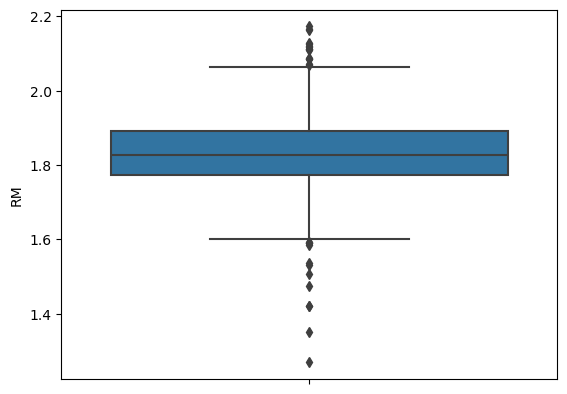

<Axes: ylabel='MEDV'>

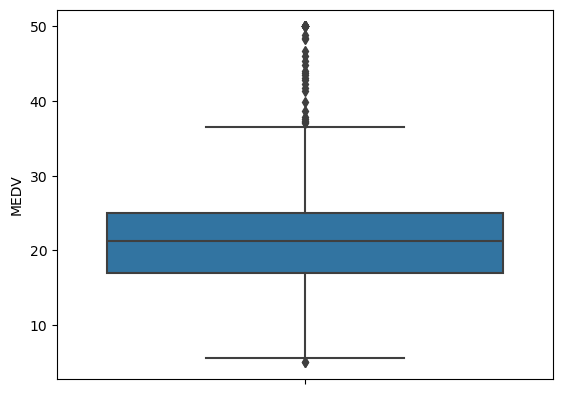

In [58]:
# Analizar outliers sn.boxplot -> data, y
sn.boxplot(data, y=features_cols[0])
plt.show()
sn.boxplot(data, y=output_col[0])

### Generar una función que se encargue de remover outliers
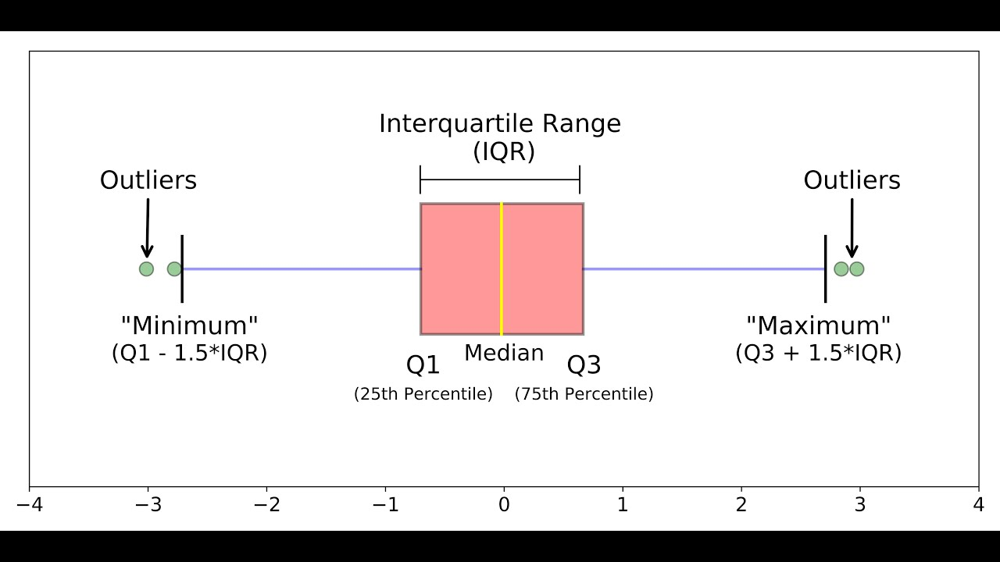

In [63]:
# Remover outliers
def remove_outliers(df:pd.DataFrame, column:str):
    df = df.copy()
    q1, q3 = np.percentile(df[column], [25, 75])
    iqr = q3 - q1
    ub = q3 + 1.5 * iqr
    lb = q1 - 1.5 * iqr
    
    df = df.query(f'{lb}<= {column} <= {ub}')
#     df = df[(df[column] <= ub) & (df[column] >= lb)]
    return df

(466, 2)
(452, 2)


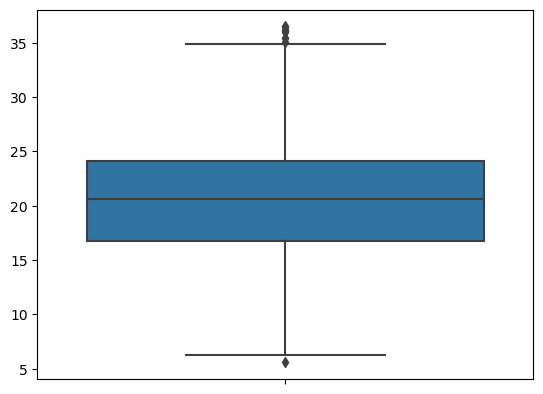

<Axes: >

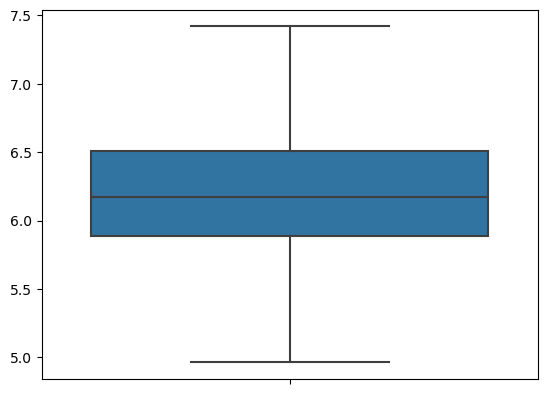

In [64]:
# Remover outliers en base a los datos de la salida
y_out = remove_outliers(data[features_cols + output_col], output_col[0])
print(y_out.shape)

# Remover outliers resultantes del paso anterior para datos de features
X_out = remove_outliers(y_out, features_cols[0])
print(X_out.shape)

# Seleccionar los datos resultantes
y_out = X_out[output_col].values
X_out = X_out[features_cols].values

# Graficar los boxplots finales
sn.boxplot(y=y_out)
plt.show()
sn.boxplot(y=X_out)



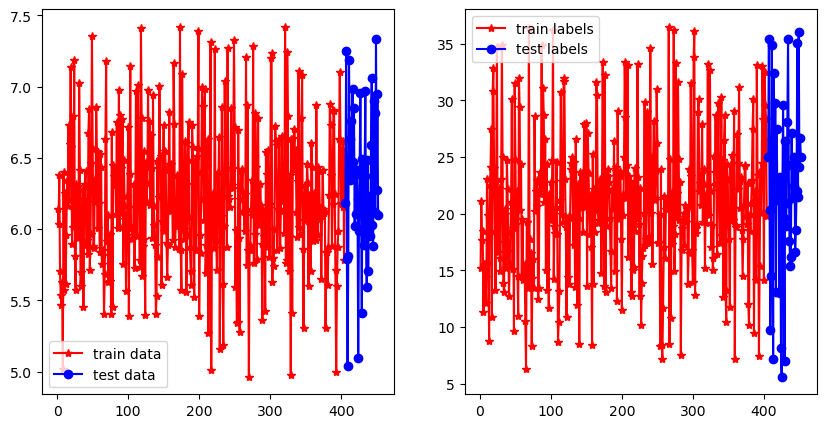

In [68]:
# Visualizo datos de entrenamiento y de prueba
TEST_SIZE = int(0.2 * data.shape[0])
TRAIN_SIZE = data.shape[0] - TEST_SIZE

t = np.arange(1, X_out.shape[0] + 1)
train_data, test_data = X_out[:TRAIN_SIZE], X_out[TRAIN_SIZE:]
train_labels, test_labels = y_out[:TRAIN_SIZE], y_out[TRAIN_SIZE:]

fig, ax = plt.subplots(1,2, figsize=(10,5))
ax[0].plot(t[:TRAIN_SIZE], train_data, 'r*-', label='train data')
ax[0].plot(t[TRAIN_SIZE:], test_data, 'bo-', label='test data')
ax[0].legend()

ax[1].plot(t[:TRAIN_SIZE], train_labels, 'r*-', label='train labels')
ax[1].plot(t[TRAIN_SIZE:], test_labels, 'bo-', label='test labels')
plt.legend()

In [69]:
test_data.shape, test_labels.shape

((47, 1), (47, 1))

In [70]:
# Normalizar los datos de entrenamiento y prueba
mean = train_data.mean(axis=0)
std = train_data.std(axis=0)
train_data = (train_data - mean) / std
test_data = (test_data - mean) / std

In [71]:
train_data.shape

(405, 1)

Crear una red neuronal MLP con las siguientes características:
* El tamaño de la capa de entrada será el tamaño de nuestra features seleccionadas de serie de tiempo anteriormente.
* Crear un red neuronal secuencial con 2 capas ocultas y 64 neuronas cada una.
* Cada capa tiene que tener una función de activación `Relu`.
* La capa de salida tiene que ser de una sóla neurona sin función de activación.

In [72]:
# Poner una semilla para replicar resultados
tf.random.set_seed(5465)

# Definir la arquitectura de la red neuronal
model = keras.Sequential([
    keras.layers.Dense(64, activation='relu', input_shape=(train_data.shape[1],)),
    keras.layers.Dense(64, activation='relu'),
    keras.layers.Dense(1)
])

model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_6 (Dense)             (None, 64)                128       
                                                                 
 dense_7 (Dense)             (None, 64)                4160      
                                                                 
 dense_8 (Dense)             (None, 1)                 65        
                                                                 
Total params: 4,353
Trainable params: 4,353
Non-trainable params: 0
_________________________________________________________________


In [73]:
# Compilar el modelo
model.compile(optimizer='rmsprop', loss='mse', metrics=['mae'])

# Entrenar el modelo
# argumentos: validation_split, shuffle, epochs, verbose
model_fit = model.fit(
    train_data, train_labels, 
    validation_split=0.2, 
    shuffle=False,
    epochs=200, 
    batch_size=32, 
    verbose=0
)

# Evaluar el modelo en el conjunto de prueba
test_mse_score, test_mae_score = model.evaluate(test_data, test_labels)
print('Error cuadrático medio en el conjunto de prueba:', test_mse_score)
print('Error absoluto medio en el conjunto de prueba:', test_mae_score)

2/2 [==============================] - 0s 11ms/step - loss: 29.0131 - mae: 4.1595
Error cuadrático medio en el conjunto de prueba: 29.01307487487793
Error absoluto medio en el conjunto de prueba: 4.159454822540283


In [74]:
model_fit.history.keys()

dict_keys(['loss', 'mae', 'val_loss', 'val_mae'])

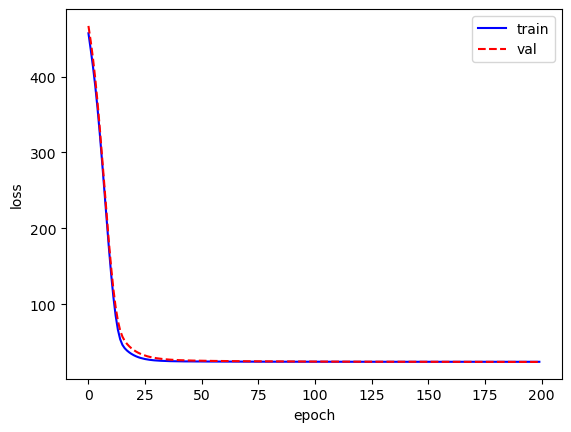

In [75]:
# Graficar el loss del conjunto de entrenamiento y de validación
plt.plot(model_fit.history['loss'], 'b', label='train')
plt.plot(model_fit.history['val_loss'], 'r--', label='val')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend()

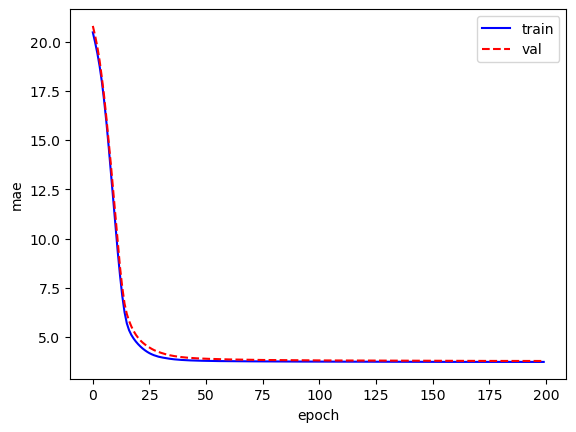

In [76]:
# Graficar métricas de error
plt.plot(model_fit.history['mae'], 'b', label='train')
plt.plot(model_fit.history['val_mae'], 'r--', label='val')
plt.ylabel('mae')
plt.xlabel('epoch')
plt.legend()

In [77]:
predicted = model.predict(test_data)

2/2 [==============================] - 0s 5ms/step


In [78]:
predicted.shape, test_data.shape

((47, 1), (47, 1))

In [79]:
t[TRAIN_SIZE:].shape, test_labels.shape

((47,), (47, 1))

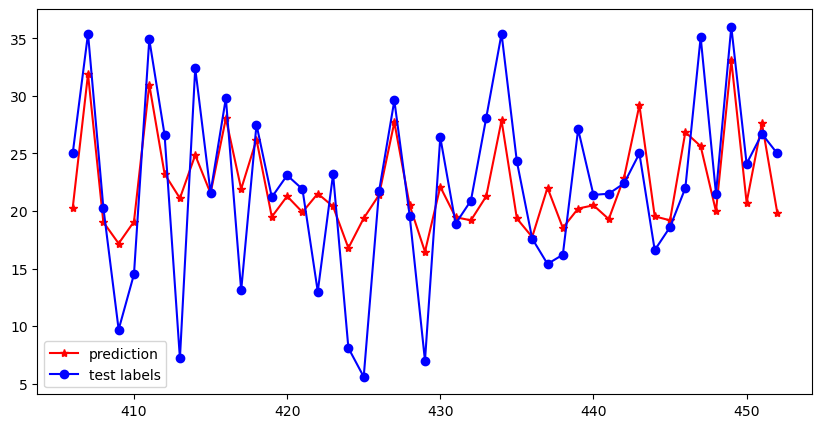

In [80]:
plt.figure(figsize=(10,5))
plt.plot(t[TRAIN_SIZE:], predicted, 'r*-', label='prediction')
plt.plot(t[TRAIN_SIZE:], test_labels, 'bo-', label='test labels')

plt.legend()

# <font color='red'> Tarea: </font>

Terminar los demás numerales faltantes de este ejercicio.

<script>
  $(document).ready(function(){
    $('div.prompt').hide();
    $('div.back-to-top').hide();
    $('nav#menubar').hide();
    $('.breadcrumb').hide();
    $('.hidden-print').hide();
  });
</script>

<footer id="attribution" style="float:right; color:#808080; background:#fff;">
Created with Jupyter by Oscar David Jaramillo Zuluaga.
</footer>